# **Visión computacional para imágenes y video**
## **Maestría en Inteligencia Artificial Aplicada**
### **Dr. Gilberto Ochoa Ruiz**
### **Tecnológico de Monterrey**
## **6.4 Google Colab - Extracción de líneas con algoritmo de Canny**
---

### Equipo 37

- Jorge Luis Ancheyta Segovia - A01796354
- Omar Aguilar Macedo - A01797078

# 3. Sobel and Canny Edge Detection

## Table of Contents
1. [Libraries](#libraries)
2. [Sobel Edge Detection](#sobel)
3. [Canny Edge Detection](#canny)
    1. [Noise Reduction](#noise-reduction)
    2. [Gradient Calculation](#gradient)
    3. [Non-Maximum Suppression](#non-max)
    4. [Double Threshold](#d-threshold)
    5. [Hysteresis](#hysteresis)
4. [Challenge](#challenge)
    1. [Introducción](#intro)
    2. [Análisis](#analisis)
    3. [Conclusiones](#conclusiones)
    4. [Notas](#notas)
4. [Referencias](#referencias)

## Importing Libraries <a class="anchor" name="libraries" ></a>

In [1]:
import cv2
import skimage
import numpy as np
from scipy import ndimage
from skimage import exposure
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage import convolve
from scipy.ndimage import gaussian_filter as gauss
from scipy.ndimage import median_filter as med

## Sobel Edge Detection <a class="anchor" name="sobel" ></a>

As a first step in extracting features, you will apply the Sobel edge detection algorithm. This finds regions of the image with large gradient values in multiple directions. Regions with high omnidirectional gradient are likely to be edges or transitions in the pixel values.

The code in the cell below applies the Sobel algorithm to the median filtered image, using these steps:

1. Convert the color image to grayscale for the gradient calculation since it is two dimensional.
2. Compute the gradient in the x and y (horizontal and vertical) directions.
3. Compute the magnitude of the gradient.
4. Normalize the gradient values.

In [2]:
def edge_sobel(image):
    from scipy import ndimage
    import skimage.color as sc
    import numpy as np
    image = sc.rgb2gray(image) # Convert color image to gray scale
    dx = ndimage.sobel(image, 1)  # horizontal derivative
    dy = ndimage.sobel(image, 0)  # vertical derivative
    mag = np.hypot(dx, dy)  # magnitude
    mag *= 255.0 / np.amax(mag)  # normalize (Q&D)
    mag = mag.astype(np.uint8)
    return mag

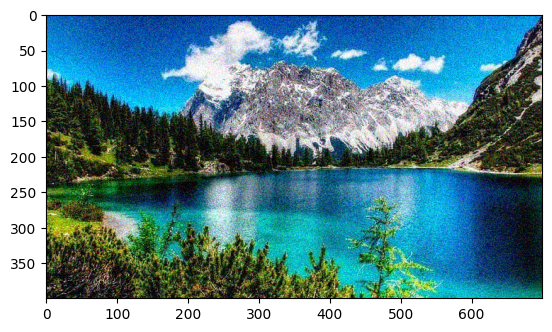

In [3]:
original_image = cv2.imread('data/image.jpg', cv2.IMREAD_COLOR)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

img = skimage.util.random_noise(original_image)
plt.imshow(img)

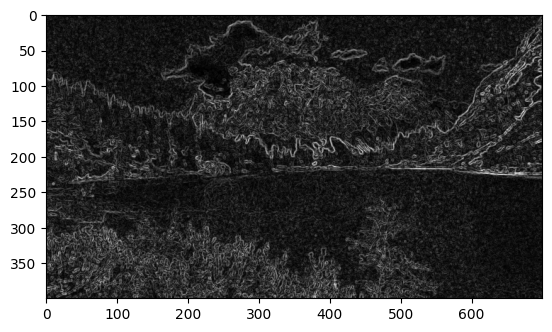

In [4]:
img_med = med(img, size=2)
img_edge = edge_sobel(img_med)
plt.imshow(img_edge, cmap="gray")

Now let's try with the more blurred gaussian filtered image.

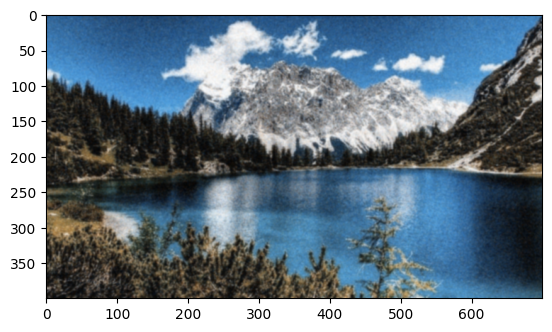

In [5]:
img_gauss = gauss(img, sigma=1)
plt.imshow(img_gauss)

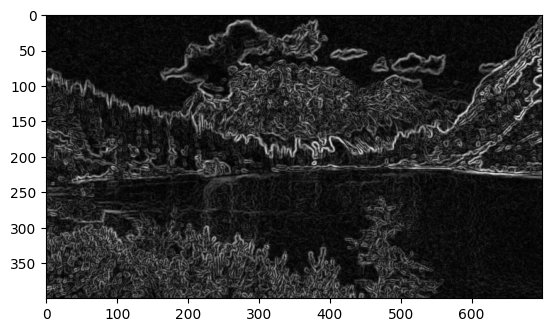

In [6]:
img_edge = edge_sobel(img_gauss)
plt.imshow(img_edge, cmap="gray")

## Canny Edge Detection <a class="anchor" name="canny" ></a>

Steps:
1. Noise Reduction
2. Gradient Calculation
3. Non-maximum Supression
4. Double Threshold
5. Edge Tracking by Hysteresis

**Pre-requisite:** Convert the image to grayscale before algorithm.

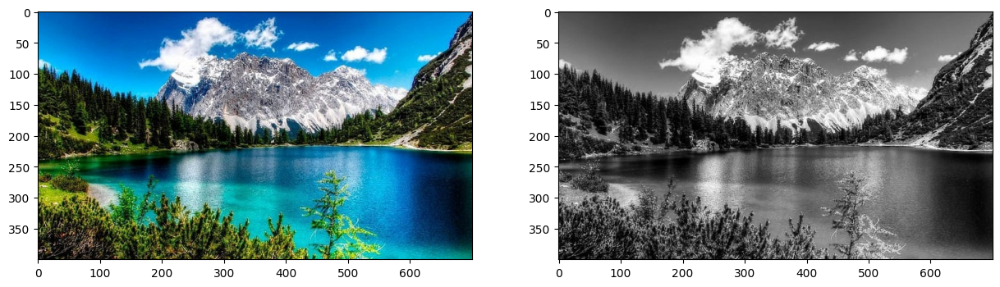

In [7]:
img = cv2.imread('data/image.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### 1. Noise Reduction <a class="anchor" name="noise-reduction" />
Edge detection are highly sensitive to image noise due to the derivatives behind the algorithm.

We can apply a Gaussian Kernel, the size of the kernel depends on the expected blurring effect. The smaller the less blurring effect.

Equation for Gaussian Kernel of size $(2k+1) \times (2k+1)$

$$
H_{i, j} = \frac{1}{2\pi\sigma^2}exp(-\frac{(i-(k+1))^2 + (j-(k+1))^2}{2\sigma^2}); 1\leq i, j \leq (2k+1)
$$

In [8]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g


def gaussian_kernel_normalized(size, sigma=1):
    g = gaussian_kernel(size, sigma)
    return g / g.sum()


### 1.1 Sigma Parameter $\sigma$

In [9]:
# Change this parameter
sigma = 10 # 1, 3, 5, 10, 20, ...

### 1.2 Kernel Size Parameter

In [10]:
kernel_size = 3

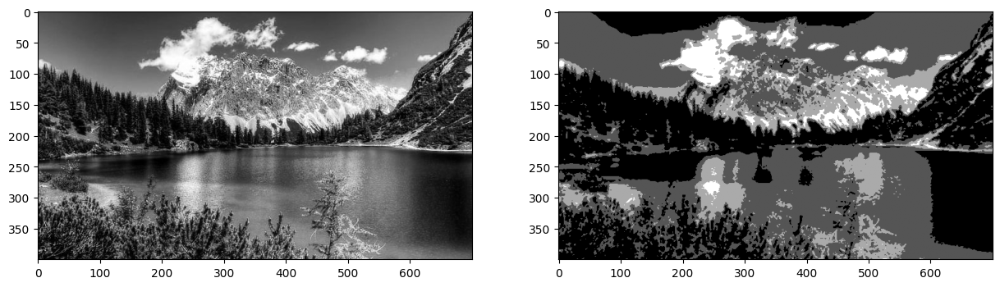

In [11]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

### 2. Gradient Calculation <a class="anchor" name="gradient" />

Edges correspond to a change of pixels intensity.

To detect it, the easiest way is to apply filters that highlight this intensity change in both directions:
- horizontal $(x)$
- and vertical $(y)$

It can be implemented by convoling $I$ with *Sobel kernels* $Kx$ and $Ky$

$$
K_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}, K_y = \begin{bmatrix}
1 & 2& 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{bmatrix}
$$

Then, the magnitude $G$ and the slope $\theta$ of the gradient are calculated as follow:

$$
|G| = \sqrt{I_x^2 + I_y^2},
\theta(x, y) = arctan(\frac{I_y}{I_x})
$$

In [12]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

    Ix = ndimage.convolve(img, Kx)
    Iy = ndimage.convolve(img, Ky)

    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)

    return (G, theta)

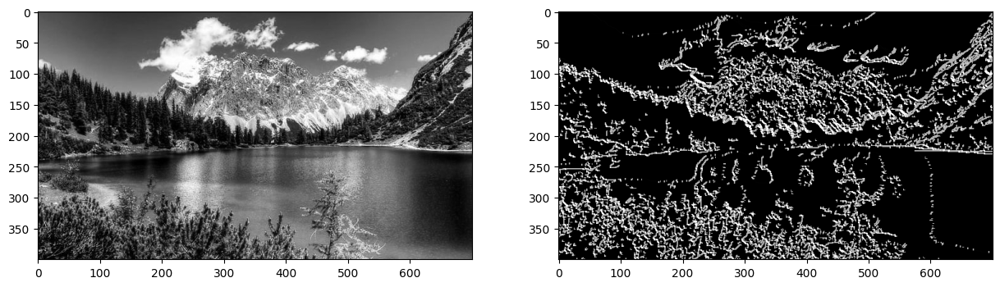

In [13]:
G, theta = sobel_filters(img_gaussian)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(G, cmap="gray")

### 3. Non-Maximum supression <a class="anchor" name="non-max"/>

1. Create a matrix initialized to 0 of the same size of the original gradient intensity matrix
2. Identify the edge direction based on the angle value from the angle matrix
3. Check if the pixel in the same direction has a higher intensity than the pixel that is currently processed
4. Return the image processed with the non-max suppression algorithm.

In [14]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180


    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255

               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass

    return Z

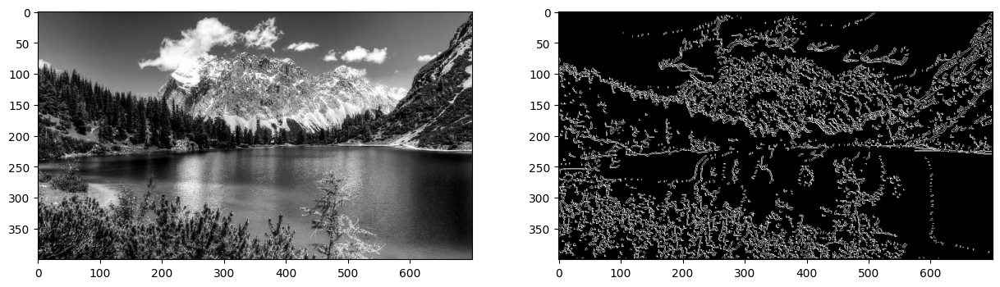

In [15]:
img_nonmax = non_max_suppression(G, theta)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_nonmax, cmap="gray")

### 4. Double threshold  <a class="anchor" name="d-threshold"/>

- Strong pixels are pixels that have an intensity so high that we are sure they contribute to the final edge.
- Weak pixels are pixels that have an intensity value that is not enough to be considered as strong ones, but yet not small enough to be considered as non-relevant for the edge detection.
- Other pixels are considered as non-relevant for the edge.

In [16]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):

    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;

    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)

    weak = np.int32(75) # originalmente estaba en 25
    strong = np.int32(255)

    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)

    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))

    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return (res)


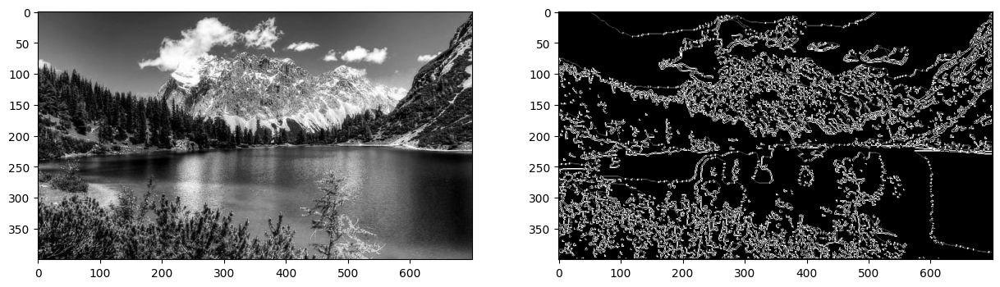

In [17]:
img_threshold = threshold(img_nonmax)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_threshold, cmap="gray")

### 5. Edge Tracking by Hysteresis <a class="anchor" name="hysteresis">

The hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one

In [18]:
def hysteresis(img, weak = 75, strong=255):
    img = img.copy()
    M, N = img.shape
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

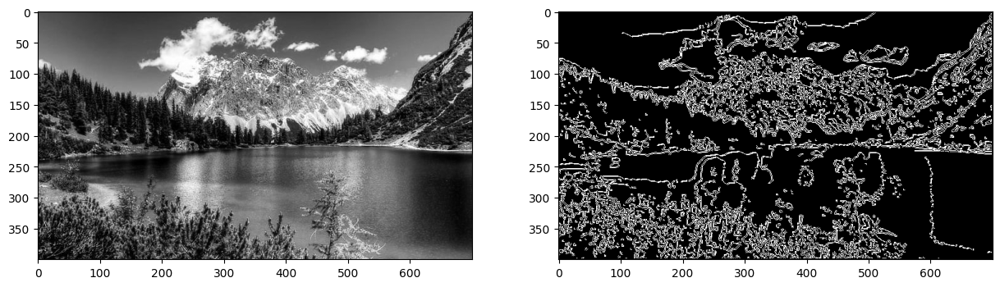

In [19]:
img_final = hysteresis(img_threshold)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_final, cmap="gray")

# Challenge <a class="anchor" name="challenge" />

En este proyecto no pediremos extensiones o nuevas funciones. Sin embargo, se pide que se modifiquen algunos parámetros para que se comprenda mejor el codigo:
   
   1. Modifica el valor de sigma y observa los cambios en las lineas detectas,
   
   2. Analiza el comportamiento del Canny Detector con y sin remoción de ruido,
   
   3. Experimenta con imágenes con diferentes cantidad de lineas y textura para observar el comportamiento del algoritmo

In [20]:
def to_uint8(img):
  return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

def add_salt_peper_noise(img):
  noisy = img.copy()
  # 5% of pixels with noise
  prob = 0.05
  rnd = np.random.rand(*img.shape)
  noisy[rnd < (prob / 2)] = 0       # pimienta (negro)
  noisy[rnd > 1 - (prob / 2)] = 255 # sal (blanco)
  return noisy


def read_image(image_path):
  img = cv2.imread(image_path, cv2.IMREAD_COLOR)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = img.astype(np.float32)
  return img

def to_gray_scale(img):
  return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def plot_canny_results(img, kernel_size = 3, sigma = 10, lowThresholdRatio = 0.05, highThresholdRatio = 0.09, weak = 75, strong = 255):
  # Blur parameters
  kernel_size = kernel_size
  sigma = sigma

  # Threshold Parameters
  lowThresholdRatio = lowThresholdRatio
  highThresholdRatio = highThresholdRatio

  # Hysteresis Parameters
  weak = weak
  strong = strong

  img_gray = to_gray_scale(img)
  # Paso 1
  # img_gauss = convolve(img_gray, gaussian_kernel(kernel_size, sigma)) # Usaremos el kernel normalizado en lugar de este
  img_gauss = convolve(img_gray, gaussian_kernel_normalized(kernel_size, sigma))
  # Paso 2
  G, theta = sobel_filters(img_gauss)
  # Paso 3
  img_nonmax = non_max_suppression(G, theta)
  # Paso 4.1
  img_threshold = threshold(img_nonmax, lowThresholdRatio=lowThresholdRatio, highThresholdRatio=highThresholdRatio)
  # Paso 4.2
  img_final = hysteresis(img_threshold, weak, strong)

  plt.figure(figsize=(16, 6))
  plt.subplot(1, 7, 1); plt.title(f'Noise Reduction, s:{sigma}, k:{kernel_size}'); plt.imshow(img_gauss.astype(np.uint8), cmap="gray"); plt.axis("off");
  plt.subplot(1, 7, 2); plt.title('Sobel Filter'); plt.imshow(G, cmap="gray"); plt.axis("off");
  plt.subplot(1, 7, 3); plt.title('Non-max'); plt.imshow(img_nonmax, cmap="gray"); plt.axis("off");
  plt.subplot(1, 7, 4); plt.title(f'Threshold, l:{lowThresholdRatio}, h: {highThresholdRatio}'); plt.imshow(img_threshold, cmap="gray"); plt.axis("off");
  plt.subplot(1, 7, 5); plt.title(f'Hysteresis, w:{weak}, s:{strong}'); plt.imshow(img_final, cmap="gray"); plt.axis("off");
  plt.tight_layout()

# Dibuja la imagen original y en escala de grises
def plot_base(img):
  img_gray = to_gray_scale(img)
  plt.figure(figsize=(6, 4))
  plt.subplot(1, 2, 1); plt.title('Original Image'); plt.imshow(to_uint8(img)); plt.axis("off");
  plt.subplot(1, 2, 2); plt.title('Grayscale Image'); plt.imshow(to_uint8(img_gray), cmap="gray"); plt.axis("off");

# Dibuja varios resultados con diferentes sigmas
def plot_sigma_example(img, sigmas):
  for i in sigmas:
    plot_canny_results(img, sigma=i, kernel_size = 5, lowThresholdRatio=.5, highThresholdRatio=.15)

# Tomamos un subset de ejemplos de sigma para el resto de imagenes
def plot_three(img):
  plot_sigma_example(img, [5, 10, 20])

# Ejemplo para comparar diferentes thresholds
def plot_threshold_example(img):
    plot_canny_results(img, sigma=10, kernel_size = 5)
    plot_canny_results(img, sigma=10, kernel_size = 5, lowThresholdRatio=.05, highThresholdRatio=.2)
    plot_canny_results(img, sigma=10, kernel_size = 5, lowThresholdRatio=.5, highThresholdRatio=.15)

# Ejemplo para comparar resultados con y sin ruido
def plot_noise_example(img):
    plot_canny_results(img, sigma=10, kernel_size = 5, lowThresholdRatio=.5, highThresholdRatio=.15)
    plot_canny_results(add_salt_peper_noise(img), sigma=10, kernel_size = 5, lowThresholdRatio=.5, highThresholdRatio=.15)

In [21]:
img_sudoku = read_image('data/sudoku.png')
img_lizard = read_image('data/lizard.jpg')
img_lake = read_image('data/image.jpg')
img_face = read_image('data/62cropSBG.jpeg')
img_creature = read_image('data/creature_01.jpg')
img_flower = read_image('data/flower_bw.jpg');

### Ejemplo 1
Imagen de Sudoku

Al usar la imagen de sudoku en la detección de líneas con canny, usando kernels muy pequeños en la parte de la reducción de ruido, hace que los resultados sean muy poco percetibles para el ojo humano incluso cuando se ajustan diferentes sigmas.

Para el caso de un kernel de valor 9, con valores de sigma más grandes, algunas líneas dejan de ser detectadas y los bordes se vuelven más toscos.


Notas:

- En la parte del threshold y hysteresis, se vió una pequeña inconsistencia en la forma en que se tratan los weak y strong, ya que el threshold se pone un valor weak a 25 pero la funcion de hysteresis busca weaks de 75, lo cual hace que no se afecten algunos valores.
- En la parte del filtro gaussiano, vimos que la función propuesta no se normaliza el kernel, esto ocasiona que algunos pixeles se vuelvan más brillosos, para los ejemplos se uso un filtro normalizado [1], fuera de esto no se notarón cambios perceptibles en los resultados.



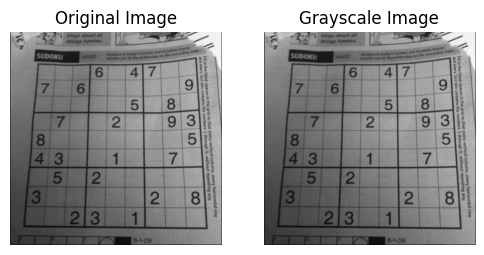

In [22]:
plot_base(img_sudoku)

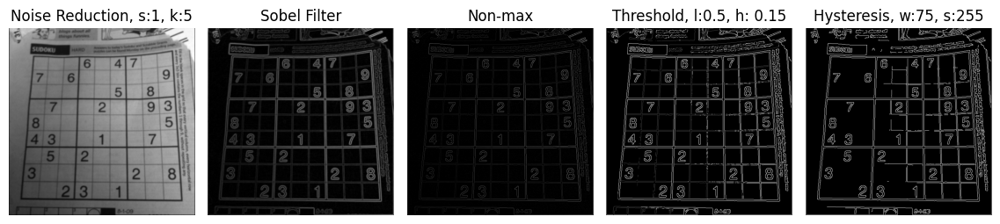

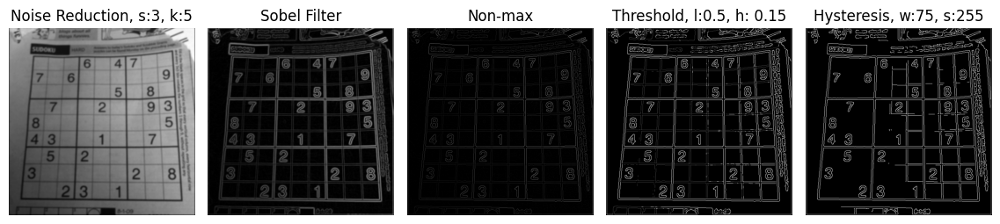

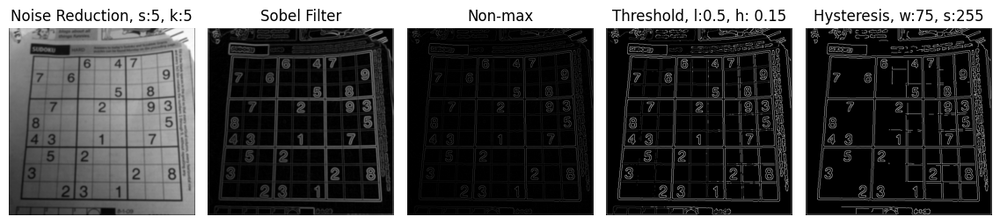

In [23]:
plot_sigma_example(img_sudoku, [1, 3, 5])

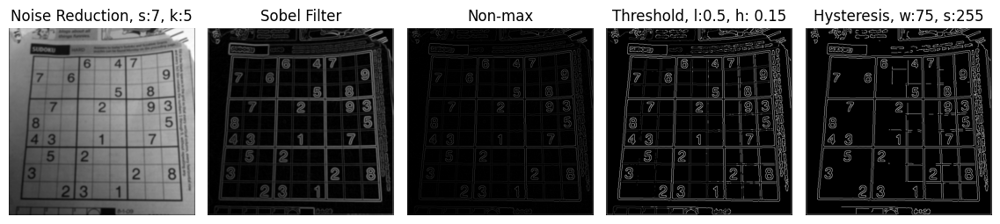

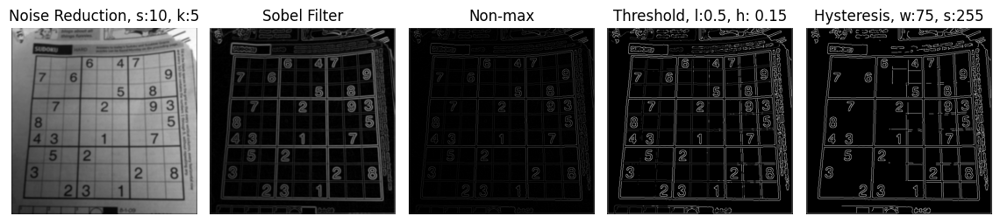

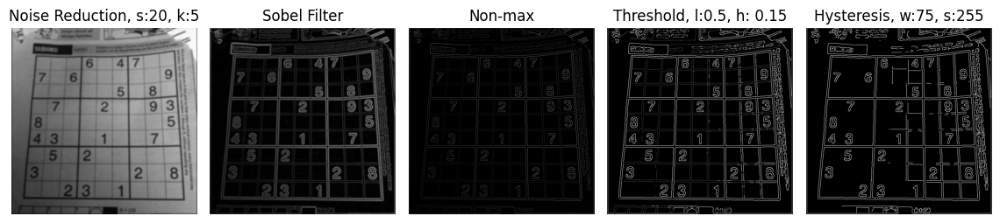

In [24]:
plot_sigma_example(img_sudoku, [7, 10, 20])

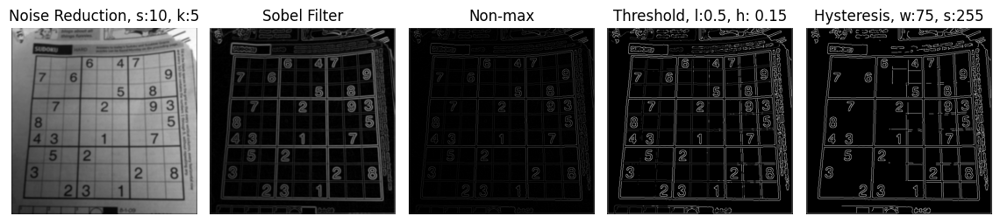

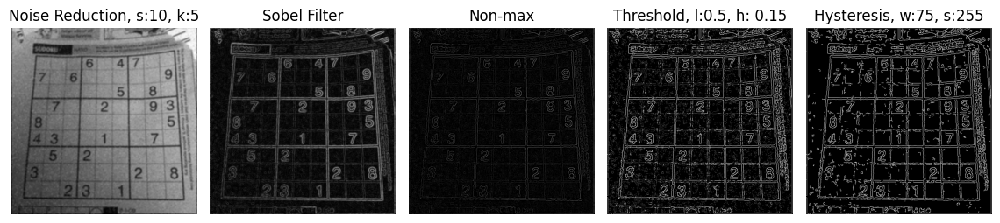

In [25]:
plot_noise_example(img_sudoku)

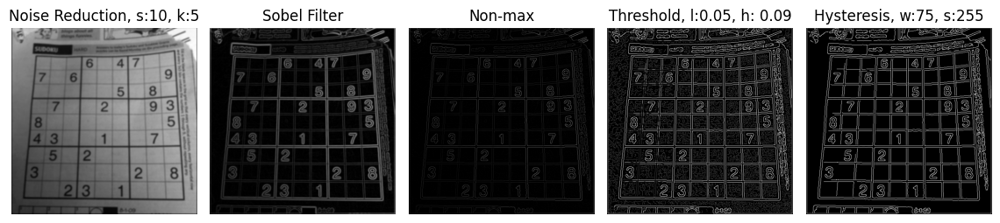

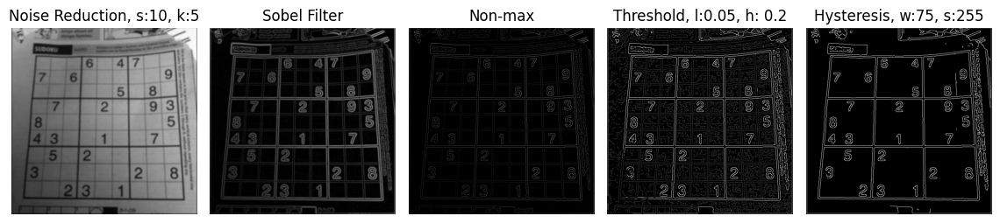

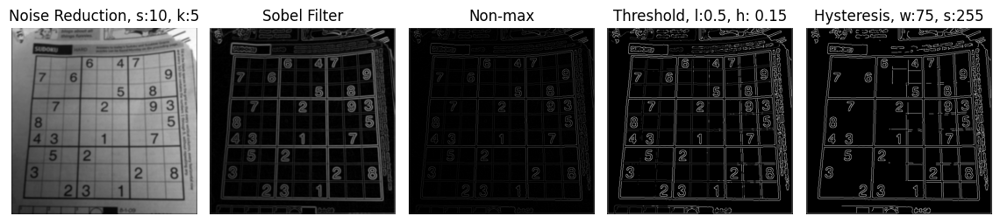

In [26]:
plot_threshold_example(img_sudoku)

### Ejemplo 2
Imagen de una Iguana

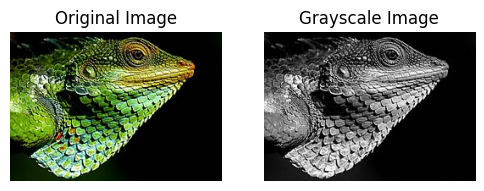

In [27]:
plot_base(img_lizard)

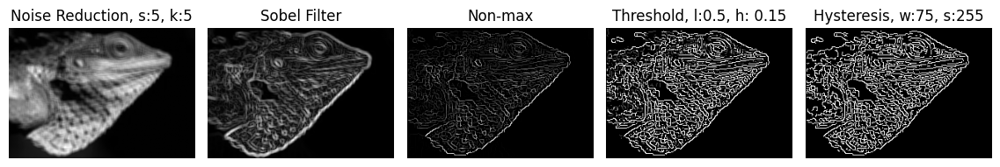

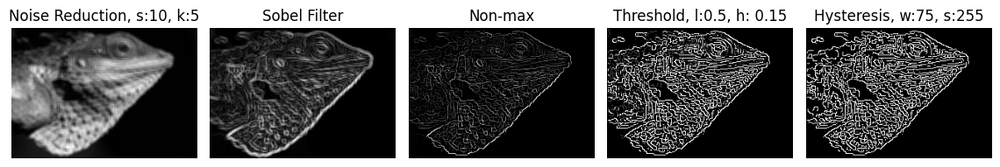

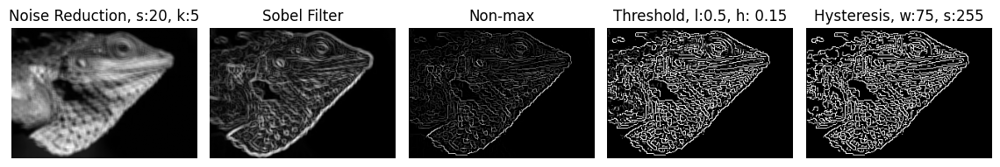

In [28]:
plot_three(img_lizard)

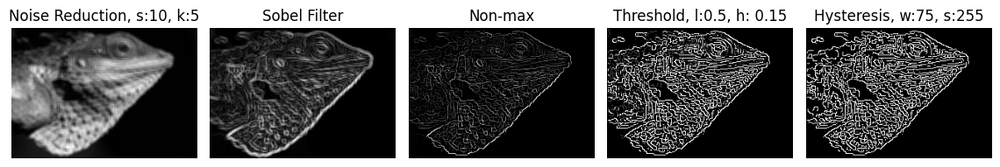

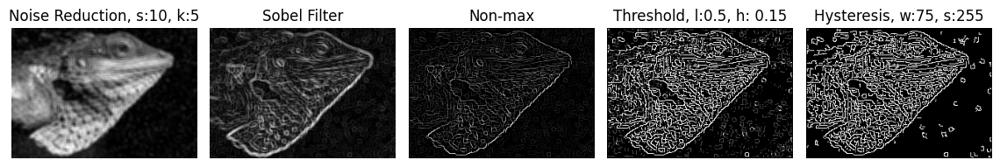

In [29]:
plot_noise_example(img_lizard)

### Ejemplo 3
Imagen de una Cara


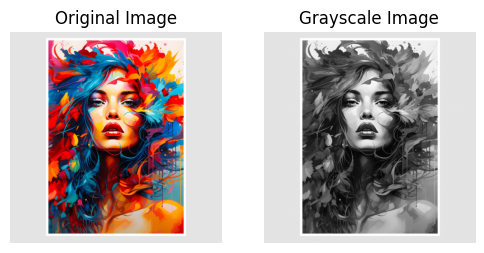

In [30]:
plot_base(img_face)

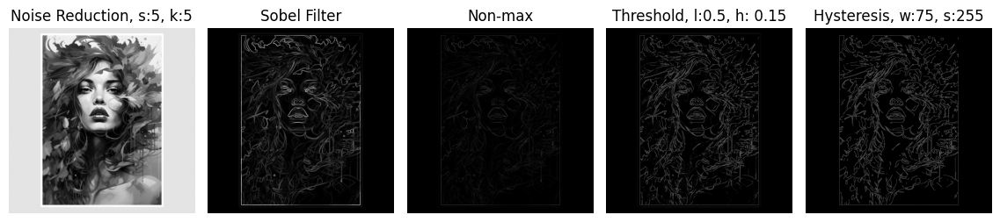

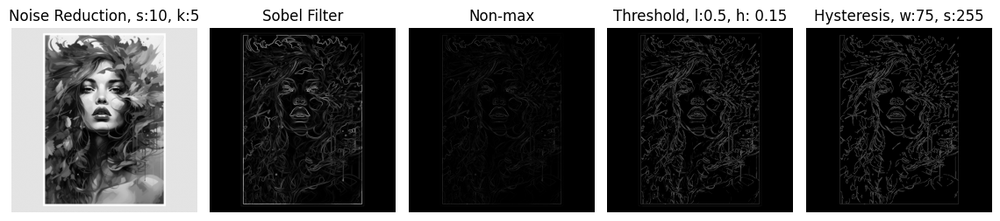

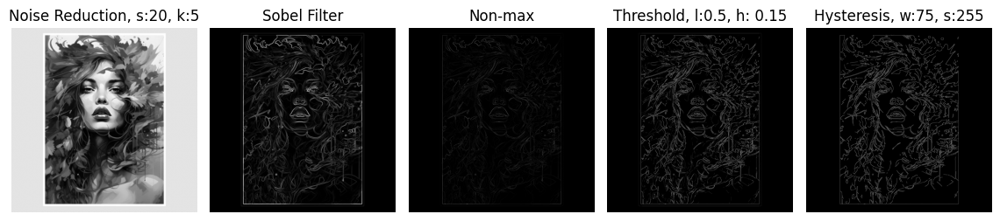

In [31]:
plot_three(img_face)

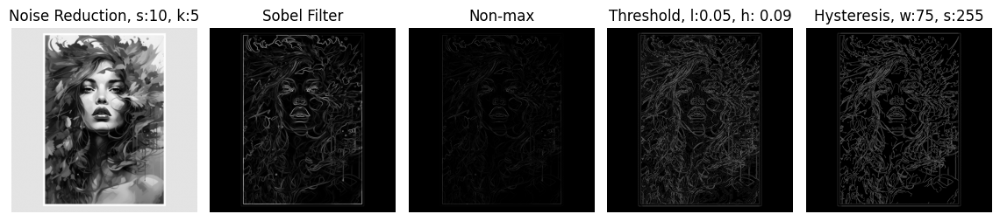

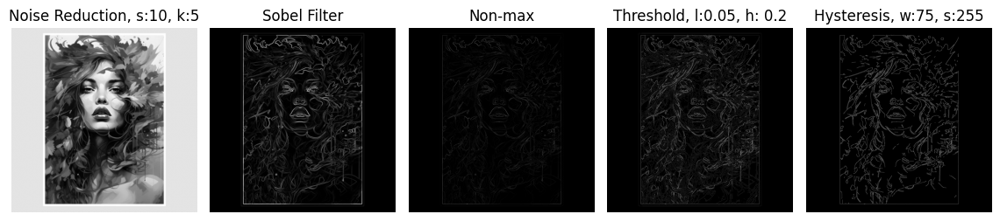

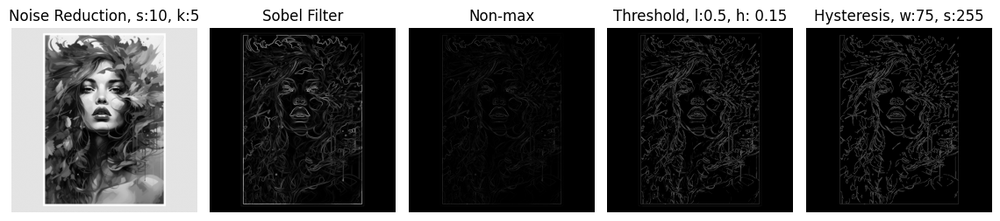

In [32]:
plot_threshold_example(img_face)

### Ejemplo 4
Imagen de una Criatura de fantasia


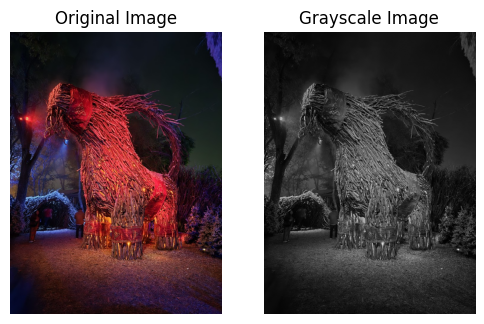

In [33]:
plot_base(img_creature)

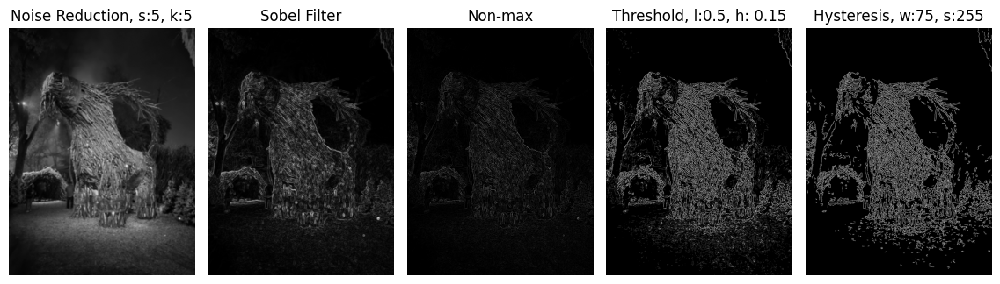

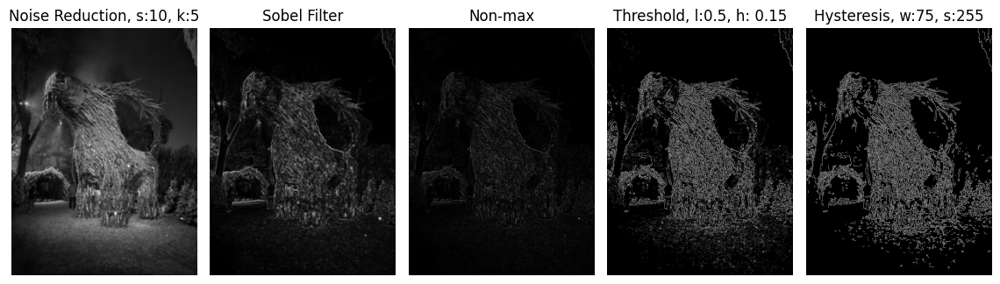

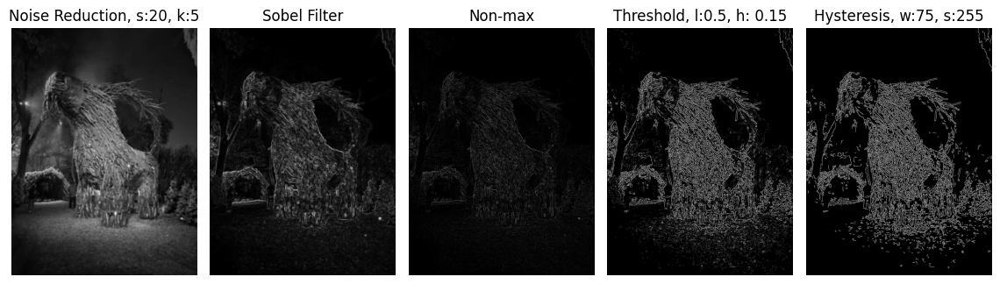

In [34]:
plot_three(img_creature);

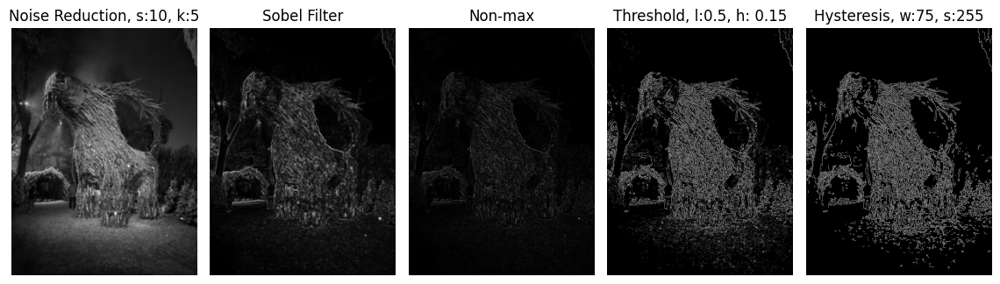

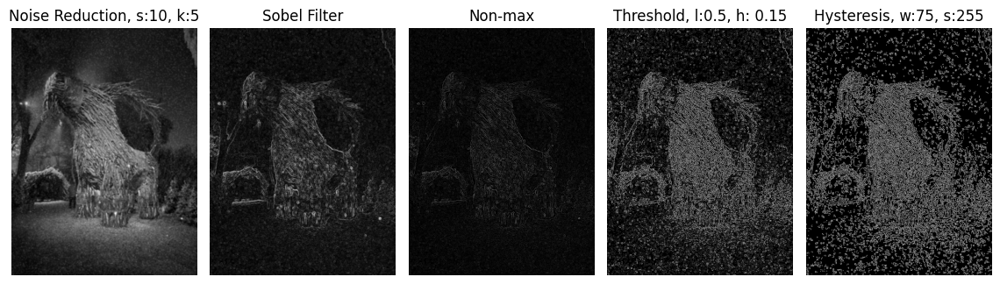

In [35]:
plot_noise_example(img_creature)

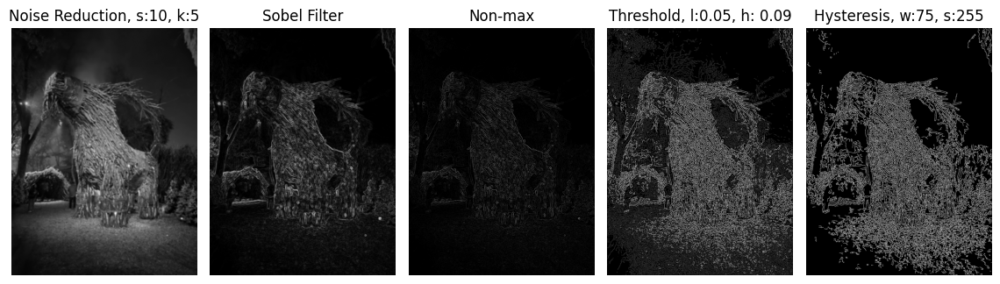

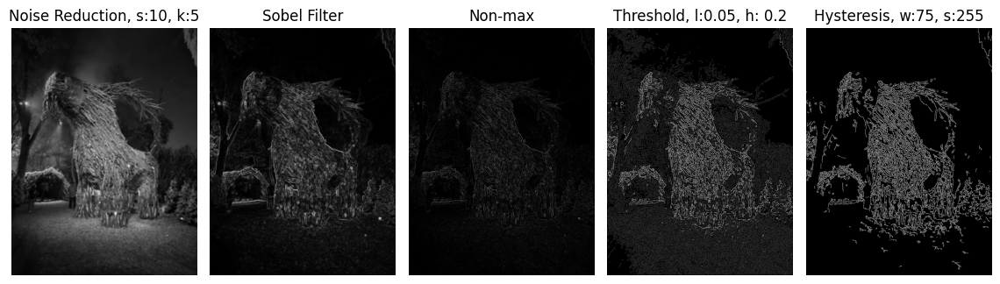

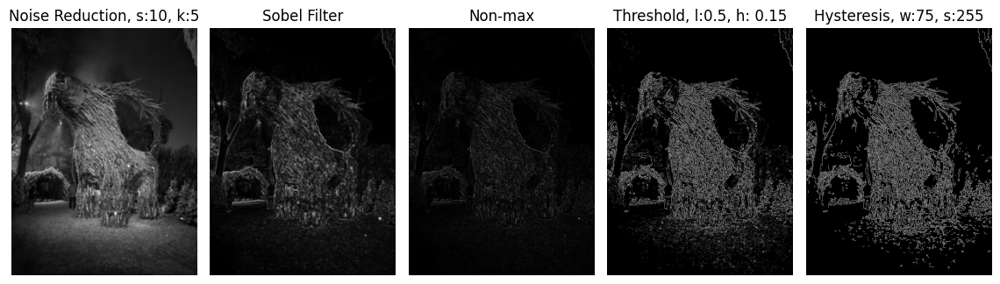

In [36]:
plot_threshold_example(img_creature)

### Ejemplo 3
Imagen de una flor


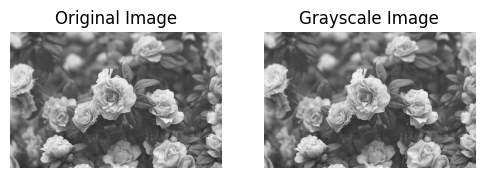

In [37]:
plot_base(img_flower)

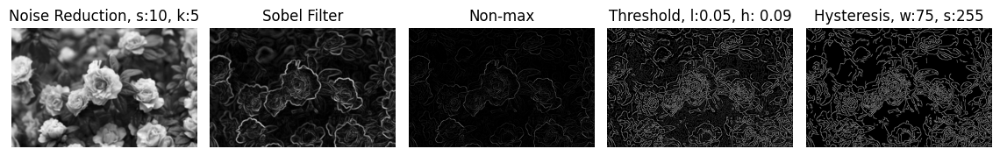

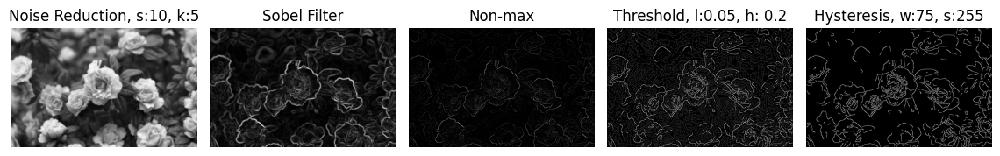

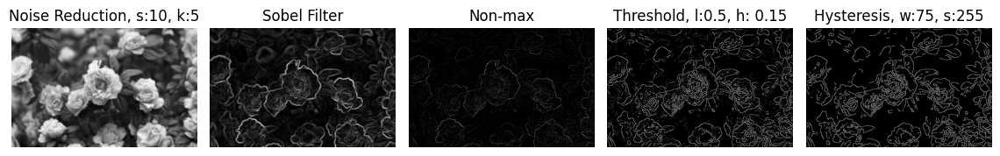

In [38]:
plot_threshold_example(img_flower)

## Introducción <a class="anchor" name="intro" />

El algoritmo propuesto por John F. Canny para la detección de bordes se basa en un conjunto de criterios que permiten identificar con precisión los puntos de borde dentro de una imagen.

El proceso de detección de bordes tiene como objetivo simplificar el análisis de imágenes, reduciendo drásticamente la cantidad de datos a procesar, pero conservando la información estructural esencial sobre los límites de los objetos [1][2].

El propósito principal del algoritmo de Canny es **reducir el ruido**, **disminuir los falsos positivos** y **obtener líneas finas y continuas** [1].

El algoritmo de Canny se desarrolla en varias etapas [1]:
- **Reducción de ruido:** se aplica un filtro gaussiano para eliminar ruido y evitar la detección de bordes falsos.
- **Cálculo del gradiente:** se obtiene la magnitud y dirección del cambio de intensidad en los ejes x y y (en este caso, se utilizó el operador **Sobel**).
- **Supresión no máxima:** se afinan los bordes eliminando píxeles que no representan la dirección de máximo gradiente.
- **Doble umbral con histéresis:** se utilizan dos umbrales (alto y bajo) para clasificar los bordes en fuertes y débiles, conservando aquellos bordes débiles conectados a uno fuerte y descartando el resto.


## Análisis <a class="anchor" name="analisis" />

En la etapa de **reducción de ruido**, se observó que el uso de kernels pequeños (por ejemplo, 3x3) produce resultados poco perceptibles visualmente, incluso al variar los valores de $\sigma$. Los cambios se vuelven más notorios al utilizar kernels de mayor tamaño (por ejemplo, de 9x9), aunque esto puede provocar que el algoritmo detecte menos líneas reales, ya que el suavizado elimina algunos detalles finos.

En el **cálculo del gradiente**, se utilizó el filtro Sobel, previamente estudiado en actividades anteriores. Este operador produce resultados consistentes en distintas imágenes, ya que además de detectar bordes, introduce un ligero efecto de suavizado que mejora la estabilidad de la detección.

En la **supresión no máxima**, los resultados muestran que el grosor de los bordes se reduce a 1 píxel, eliminando redundancias y simplificando el mapa de bordes para la etapa de umbralización.

Respecto al **doble umbral (thresholding)**, se observó que al disminuir los valores de los umbrales (ratios más bajos), aumenta la cantidad de bordes detectados. Sin embargo, establecer un umbral demasiado alto en imágenes con muchos detalles puede provocar la pérdida de información fina.

Se espera que en la práctica de extracción de características sea posible analizar con mayor profundidad cómo afectan estos parámetros en aplicaciones concretas.

Finalmente, en presencia de ruido, se comprobó que Canny tiende a detectar bordes falsos, lo que refuerza la importancia de una correcta selección del filtro de suavizado y sus parámetros iniciales.


## Conclusiones <a class="anchor" name="conclusiones" />

Durante esta actividad se comprendió en detalle el funcionamiento del algoritmo de Canny y cómo los resultados dependen de la elección adecuada de los parámetros en cada etapa. Un suavizado deficiente puede generar bordes falsos, afectando la etapa de umbralización e histéresis y, en consecuencia, la calidad final de los bordes de la imagen.

Los pasos de doble umbral e histéresis son útiles para reducir falsos positivos, pero su efectividad se ve limitada si los parámetros previos (filtro y gradiente) no fueron correctamente ajustados.

Asimismo, se observó que el algoritmo es sensible al ruido, ya que en imágenes con alta variabilidad de intensidad tiende a detectar bordes inexistentes.



## Notas: <a class="anchor" name="notas" />

En la etapa de threshold e hysteresis se detectó una inconsistencia: el valor asignado a los píxeles débiles en la función de umbral (25) no coincide con el valor esperado por la función de histéresis (75), impidiendo que algunos bordes débiles sean promovidos correctamente (por lo que se hizo el ajuste correspondiente en la función).


En la implementación del filtro gaussiano, se identificó que el kernel original no estaba normalizado, lo cual provocaba un incremento de brillo en algunos píxeles. Para los experimentos se utilizó un filtro normalizado [3], sin que esto afectara perceptiblemente los resultados finales.


# Referencias: <a class="anchor" name="referencias" />


[1] J. F. Canny, "A computational approach to edge detection", IEEE Transactions on Pattern Analysis and Machine Intelligence, vol. PAMI-8, no. 6, pp. 679-698, Nov. 1986. doi: 10.1109/TPAMI.1986.4767851.

[2] Wikipedia Contributors, "Canny edge detector", Wikipedia, Apr. 14, 2019. https://en.wikipedia.org/wiki/Canny_edge_detector

[3] M. K. Chung, Diffusion and Gaussian Kernel Smoothing, University of Wisconsin-Madison, 2018. [Online]. Available: https://pages.stat.wisc.edu/~mchung/teaching/MIA/reading/diffusion.gaussian.kernel.pdf.pdf

